**<h1> Manipulating Images </h1>**


Estimated time needed: **60** minutes


<h2>Objectives</h2>


In this lab, you will learn how to manipulate images, both as arrays and PIL image objects. You will learn how to copy an image to avoid aliasing. We will cover flipping images and cropping images. You will also learn to change pixel images; this will allow you to draw shapes, write text and superimpose images over other images.


<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


----


Download the images for the lab:


In [1]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png -O cat.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


We will be using these imported functions in the lab:


In [3]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

## Copying Images


If you want to reassign an array to another variable, you should use the `copy` method. 


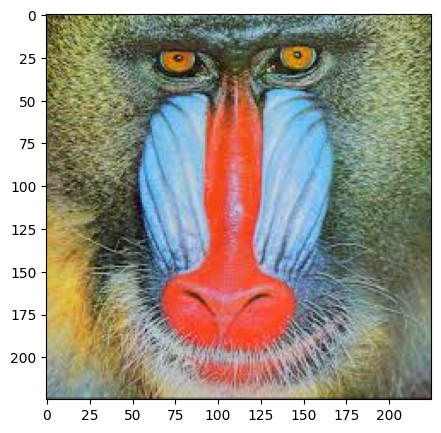

In [6]:
baboon = np.array(Image.open('baboon.jpg')) #mở ảnh baboon.jpg bằng pillow rồi chuyển sang mảng numpy biểu diễn pixel
plt.figure(figsize=(5,5)) #tạo một khung hình mới với kích thước 5x5 inch để hiển thị ảnh
plt.imshow(baboon) #hiển thị mảng numpy như một ảnh màu rgb
plt.show() #hiển thị hình ảnh 

If we do not apply the method `copy()`, the two variables would point to the same location in memory:


In [7]:
A = baboon #gán A trỏ đến cùng vùng nhớ với biến baboon

We use the  `id`  function to find a variable's memory address; we see the objects in the memory space which the variables `A` and `baboon` point to are the same.


In [8]:
id(A) == id(baboon) #kiểm tra A và baboon có cùng địa chỉ bộ nhớ hay không

True

However, if we apply method `copy()`, their memory addresses are different.


In [9]:
B = baboon.copy() #tạo một bản sao độc lập của baboon sang vùng nhớ mới
id(B)==id(baboon) #kiểm tra B và baboon có cùng địa chỉ bộ nhớ hay không

False

There may be unexpected behaviours when two variables point to the same object in memory. Consider the array `baboon`. If we set all its entries to zero, all entires in `A` will become zero as well. However, as `baboon` and `B` points to different objects, the values in `B` will not be affected. 


In [10]:
baboon[:,:,] = 0 #gán toàn bộ giá trị pixel về 0 làm ảnh trở thành màu đen

We can compare the variables <code>baboon</code> and array <code>A</code>:


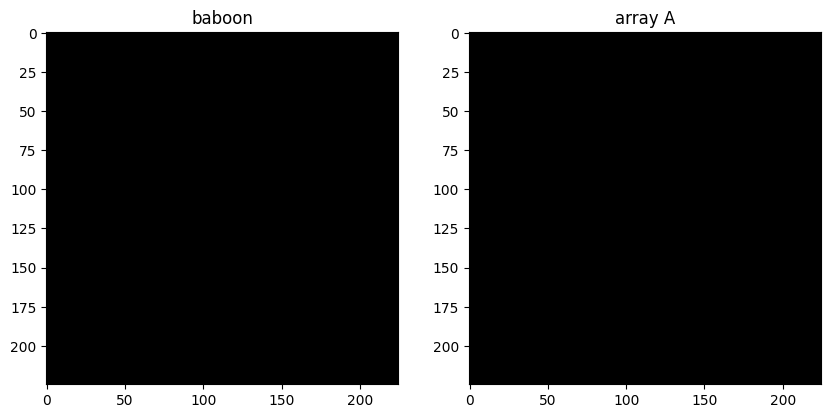

In [17]:
plt.figure(figsize=(10,10)) #tạo figure mới với kích thước 10x10 inch để hiển thị ảnh
plt.subplot(121) #chia figure thành lưới 1 hàng 2 cột và chọn ô đầu tiên
plt.imshow(baboon) #hiển thị ảnh baboon hiện tại
plt.title("baboon") #đặt tiêu đề cho ảnh baboon
plt.subplot(122) #chuyển sang ô thứ hai trong lưới subplot
plt.imshow(A) #hiển thị ảnh từ biến A dùng chung vùng nhớ với baboon
plt.title("array A") #đặt tiêu đề cho ảnh array A
plt.show() #hiển thị toàn bộ figure

We see they are the same. This behaviour is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable. Variables are references to values on the memory. 

We can also compare <code>baboon</code> and array <code>B</code>:


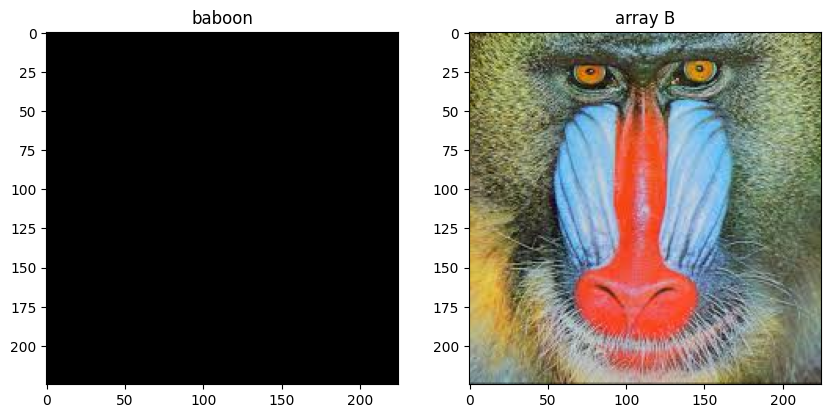

In [12]:
plt.figure(figsize=(10,10)) #tạo figure mới với kích thước 10x10 inch
plt.subplot(121) #chia figure thành lưới 1 hàng 2 cột và chọn ô đầu tiên
plt.imshow(baboon) #hiển thị ảnh baboon sau khi bị thay đổi giá trị pixel
plt.title("baboon") #đặt tiêu đề cho ảnh baboon
plt.subplot(122) #chuyển sang ô thứ hai trong lưới subplot
plt.imshow(B) #hiển thị ảnh B là bản sao độc lập không bị ảnh hưởng
plt.title("array B") #đặt tiêu đề cho ảnh array B
plt.show() #hiển thị toàn bộ figure


If a PIL function does not return a new image, the same principle applies. We will go over some examples later on. 


## Flipping Images 


Flipping images involves reordering the indices of the pixels such that it changes the orientation of the image. Consider the following image:


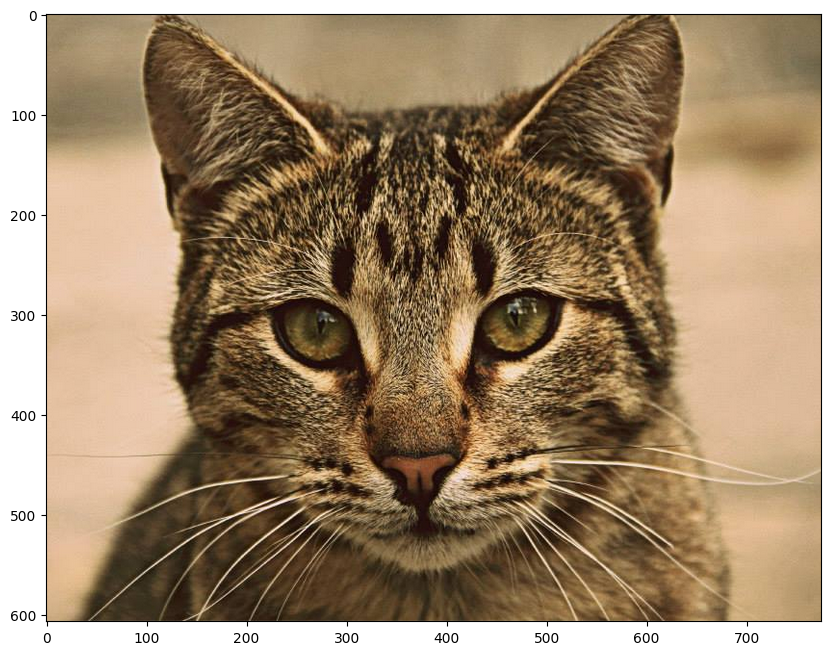

In [19]:
image = Image.open("cat.png") #mở ảnh cat.png bằng pillow dưới dạng đối tượng image
plt.figure(figsize=(10,10)) #tạo figure mới với kích thước 10x10 inch
plt.imshow(image) #hiển thị ảnh gốc cat.png
plt.show() #hiển thị ảnh ra màn hình

We can cast it to an array and find its shape:


In [20]:
array = np.array(image) #chuyển ảnh pillow sang mảng numpy biểu diễn pixel
width, height, C = array.shape #lấy chiều rộng, chiều cao và số kênh màu của ảnh
print('width, height, C', width, height, C) #in ra kích thước và số kênh màu của ảnh

width, height, C 607 775 3


Let's flip, i.e rotate vertically, the image. Let's try the traditional approach. First, we create an array of the same size with datatype <code>np.uint8</code>.


In [21]:
array_flip = np.zeros((width, height, C), dtype=np.uint8) #tạo mảng rỗng để lưu ảnh lật với cùng kích thước và kiểu dữ liệu

We assign the first row of pixels of the original array to the new array’s last row. We repeat the process for every row, incrementing the row number from the original array and decreasing the new array’s row index to assign the pixels accordingly. After excecuting the for loop below, `array_flip` will become the flipped image. 


In [22]:
for i, row in enumerate(array): #duyệt từng hàng pixel của ảnh kèm chỉ số i
    array_flip[width - 1 - i, :, :] = row #gán hàng hiện tại vào vị trí đối xứng để lật ảnh theo chiều dọc

<code>PIL</code> has several ways to flip an image, for example, we can use the <code>ImageOps</code> module:


In [23]:
from PIL import ImageOps #import module imageops để hỗ trợ các phép lật và biến đổi ảnh nhanh

The `flip()` method of `ImageOps` module flips the image. The `mirror()` method will mirror  the image:


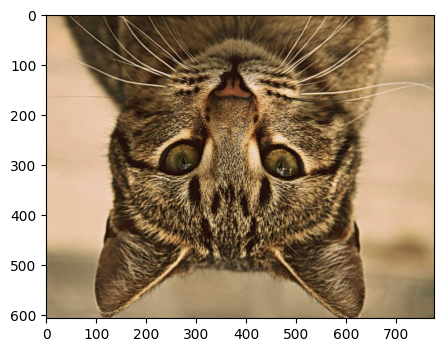

In [24]:
im_flip = ImageOps.flip(image) #lật ảnh theo chiều dọc trên dưới
plt.figure(figsize=(5,5)) #tạo figure mới kích thước 5x5 inch
plt.imshow(im_flip) #hiển thị ảnh đã lật dọc
plt.show() #hiển thị ảnh ra màn hình

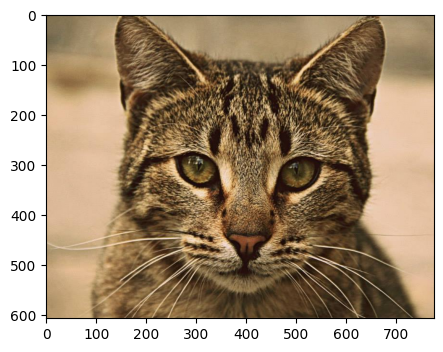

In [25]:
im_mirror = ImageOps.mirror(image) #lật ảnh theo chiều ngang trái phải
plt.figure(figsize=(5,5))
plt.imshow(im_mirror) #hiển thị ảnh đã lật ngang
plt.show() 

We can use  the <code>transpose()</code> method; the parameter is an integer indicating what type of transposition we would like to perform. For example, we can flip the image using a value of `1`.


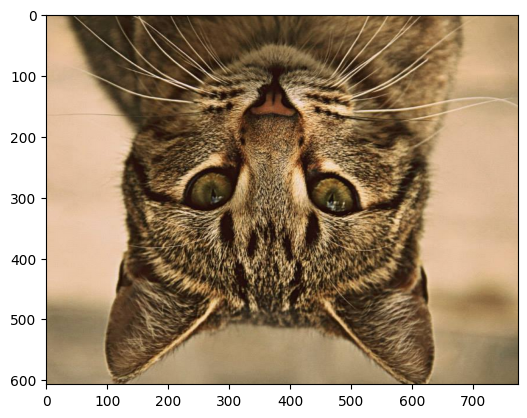

In [26]:
im_flip = image.transpose(1) #lật ảnh theo chiều dọc bằng phương thức transpose
plt.imshow(im_flip) #hiển thị ảnh đã lật
plt.show()

The Image module has built-in attributes that describe the type of flip. The values are just integers. Several are shown in the following <code>dict</code>:


In [27]:
flip = {"FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT, #định nghĩa phép lật ảnh trái sang phải
        "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM, #định nghĩa phép lật ảnh trên xuống dưới
        "ROTATE_90": Image.ROTATE_90, #định nghĩa phép xoay ảnh 90 độ
        "ROTATE_180": Image.ROTATE_180, #định nghĩa phép xoay ảnh 180 độ
        "ROTATE_270": Image.ROTATE_270, #định nghĩa phép xoay ảnh 270 độ
        "TRANSPOSE": Image.TRANSPOSE, #định nghĩa phép hoán vị trục ảnh
        "TRANSVERSE": Image.TRANSVERSE} #định nghĩa phép hoán vị trục ngược

We see the values are integers.


In [29]:
flip["FLIP_LEFT_RIGHT"] #truy xuất giá trị tương ứng với phép lật trái phải trong dictionary

0

We can plot each of the outputs using the different  parameter values:


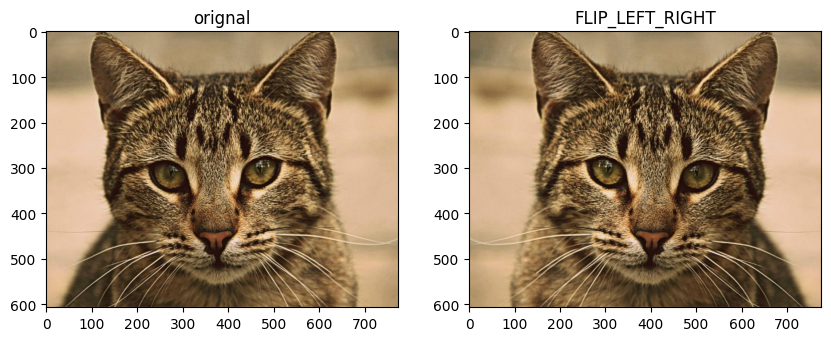

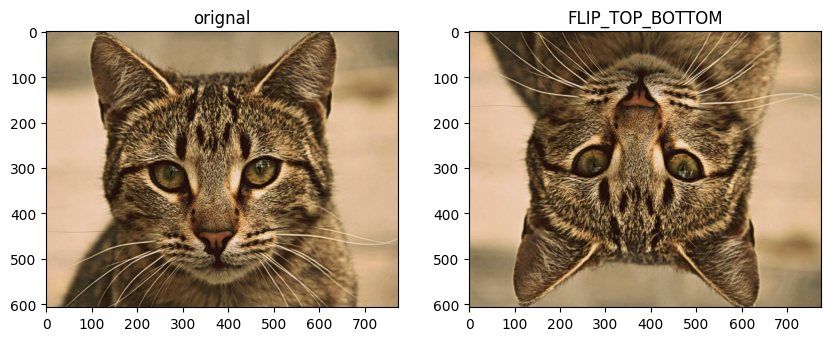

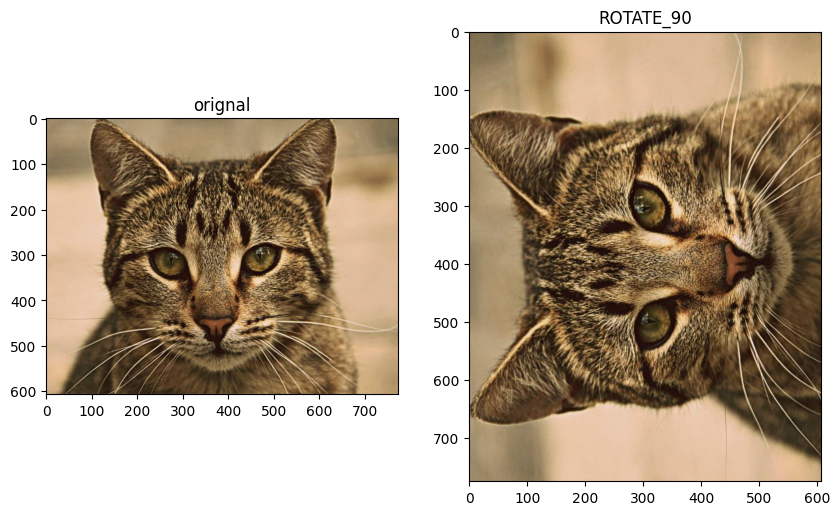

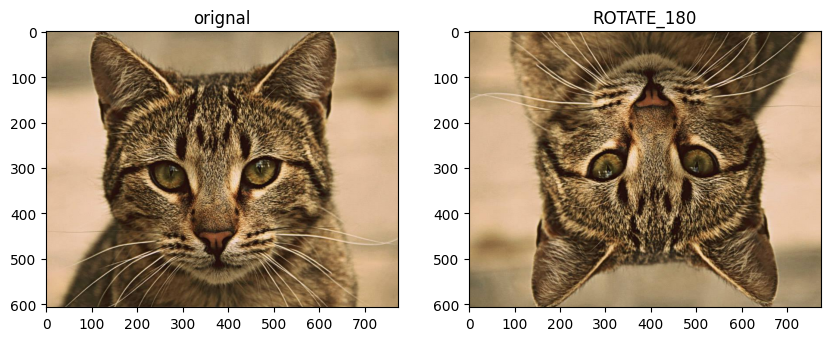

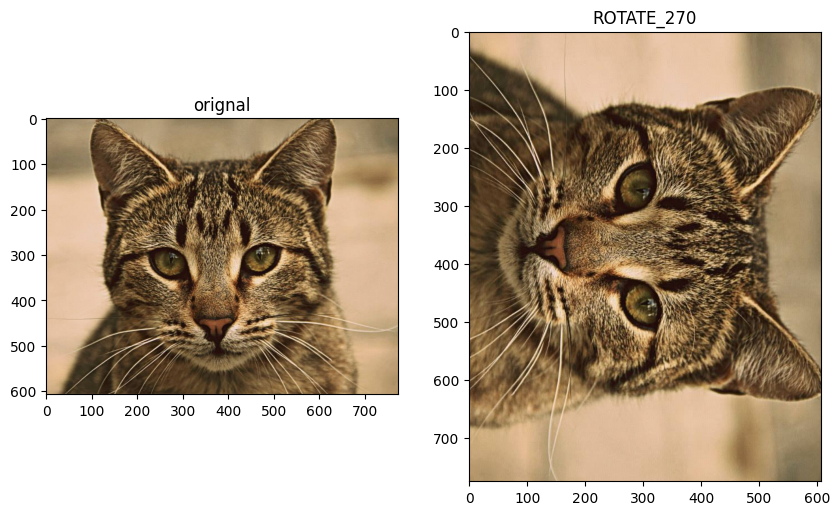

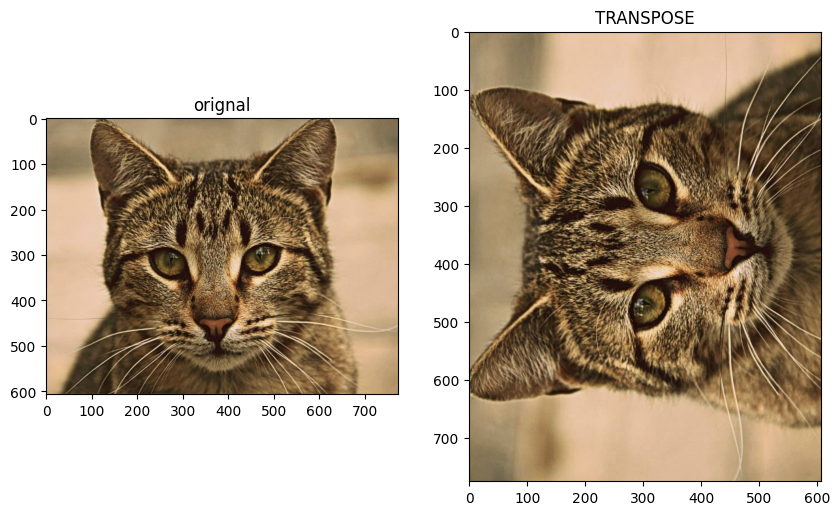

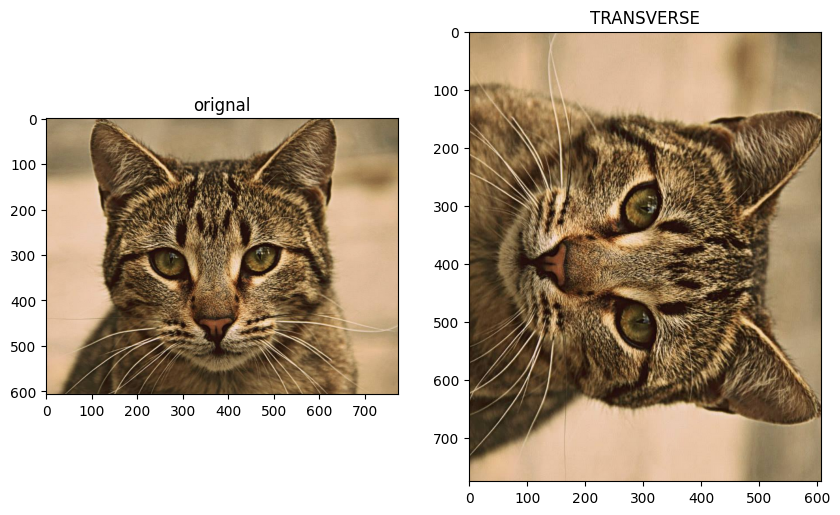

In [28]:
for key, values in flip.items(): #duyệt từng phép biến đổi ảnh trong dictionary
    plt.figure(figsize=(10,10)) #tạo figure mới kích thước 10x10 inch
    plt.subplot(1,2,1) #chia figure thành 1 hàng 2 cột và chọn ô đầu tiên
    plt.imshow(image) #hiển thị ảnh gốc
    plt.title("orignal") #đặt tiêu đề cho ảnh gốc
    plt.subplot(1,2,2) #chuyển sang ô thứ hai
    plt.imshow(image.transpose(values)) #hiển thị ảnh sau khi áp dụng phép biến đổi
    plt.title(key) #đặt tiêu đề theo tên phép biến đổi
    plt.show() #hiển thị từng cặp ảnh

 ## Cropping an Image


Cropping is the act of "cutting out" a part of an image and throwing out the rest. We can perform cropping using array slicing. 

Let start with a vertical crop: the variable `upper` is the index of the first row that we would like to include in the image, the variable `lower` is the index of the last row we would like to include. We then perform array slicing to obtain the new image. 


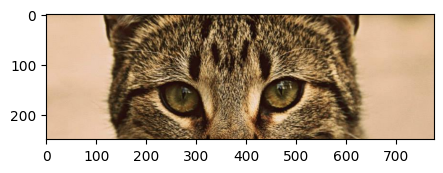

In [30]:
upper = 150 #xác định vị trí cắt phía trên theo trục y
lower = 400 #xác định vị trí cắt phía dưới theo trục y
crop_top = array[upper:lower, :, :] #cắt ảnh theo chiều dọc bằng slicing numpy
plt.figure(figsize=(5,5)) #tạo figure mới kích thước 5x5 inch
plt.imshow(crop_top) #hiển thị phần ảnh đã cắt theo chiều dọc
plt.show() #hiển thị ảnh ra màn hình

Consider the array `crop_top`: we can also crop horizontally. The variable `right` is the index of the first column that we would like to include in the image and the variable `left` is the index of the last column we would like to include in the image.


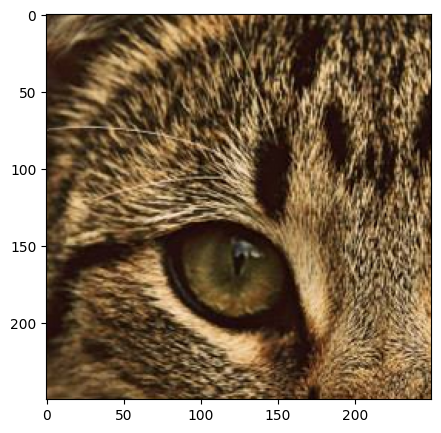

In [31]:
left = 150 #xác định vị trí cắt bên trái theo trục x
right = 400 #xác định vị trí cắt bên phải theo trục x
crop_horizontal = crop_top[:, left:right, :] #cắt tiếp ảnh theo chiều ngang
plt.figure(figsize=(5,5)) #tạo figure mới kích thước 5x5 inch
plt.imshow(crop_horizontal) #hiển thị phần ảnh đã cắt theo chiều ngang
plt.show() #hiển thị ảnh ra màn hình

You can crop the PIL image using the <code>crop()</code> method, using the parameters from above Set the cropping area with <code>box=(left, upper, right, lower)</code>.


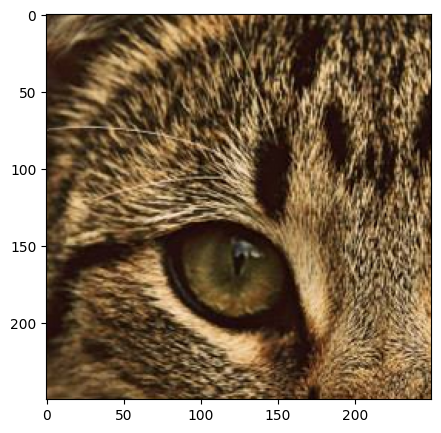

In [32]:
image = Image.open("cat.png") #mở lại ảnh gốc bằng pillow
crop_image = image.crop((left, upper, right, lower)) #cắt ảnh bằng pillow theo hộp tọa độ (left, upper, right, lower)
plt.figure(figsize=(5,5)) #tạo figure mới kích thước 5x5 inch
plt.imshow(crop_image) #hiển thị ảnh đã cắt bằng pillow
plt.show() #hiển thị ảnh ra màn hình

We can also flip the new image:


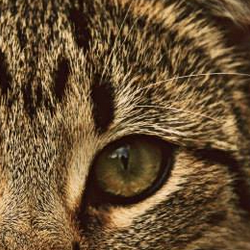

In [33]:
crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT) #lật ảnh đã cắt theo chiều ngang
crop_image #hiển thị đối tượng ảnh sau khi lật trong notebook

## Changing Specific Image Pixels


We can change specific image pixels using  array indexing; for example, we can set  all the green and blue channels in the original image we cropped to zero:


In [34]:
array_sq = np.copy(array) #tạo bản sao độc lập của mảng ảnh để tránh thay đổi ảnh gốc
array_sq[upper:lower, left:right, 1:3] = 0 #đặt kênh green và blue về 0 trong vùng cắt để tạo hình vuông màu đỏ

We can compare the results with the new image. 


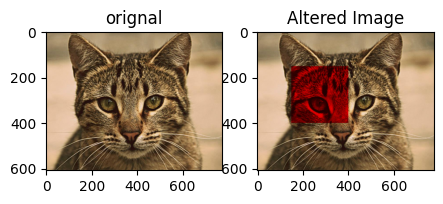

In [35]:
plt.figure(figsize=(5,5)) #tạo figure mới kích thước 5x5 inch
plt.subplot(1,2,1) #chia figure thành 1 hàng 2 cột và chọn ô đầu tiên
plt.imshow(array) #hiển thị ảnh gốc
plt.title("orignal") #đặt tiêu đề cho ảnh gốc
plt.subplot(1,2,2) #chuyển sang ô thứ hai
plt.imshow(array_sq) #hiển thị ảnh đã bị thay đổi pixel
plt.title("Altered Image") #đặt tiêu đề cho ảnh đã chỉnh sửa
plt.show() #hiển thị toàn bộ figure

We can also use the `ImageDraw` module from `PIL` library, which provides simple 2D graphics for Image objects 


In [37]:
from PIL import ImageDraw #import module imagedraw để vẽ hình trực tiếp lên ảnh

We will copy the image object:


In [38]:
image_draw = image.copy() #tạo bản sao ảnh để vẽ mà không làm thay đổi ảnh gốc

The draw constructor creates an object that can be used to draw in the given image. The input <code>im</code> is the image we would like to draw in.



In [39]:
image_fn = ImageDraw.Draw(im=image_draw) #khởi tạo đối tượng vẽ gắn với ảnh

Whatever method we apply to the object <code>image_fn</code>, will change the image object <code>image_draw</code>.


We can draw a rectangle using the <code>rectangle</code> function, two important parameters include: <code>xy</code> – the coordinates bounding box  and <code>fill</code> – Color of the rectangle.


In [40]:
shape = [left, upper, right, lower] #xác định tọa độ hình chữ nhật cần vẽ
image_fn.rectangle(xy=shape, fill="red") #vẽ hình chữ nhật màu đỏ theo tọa độ đã định nghĩa

We can plot the image.


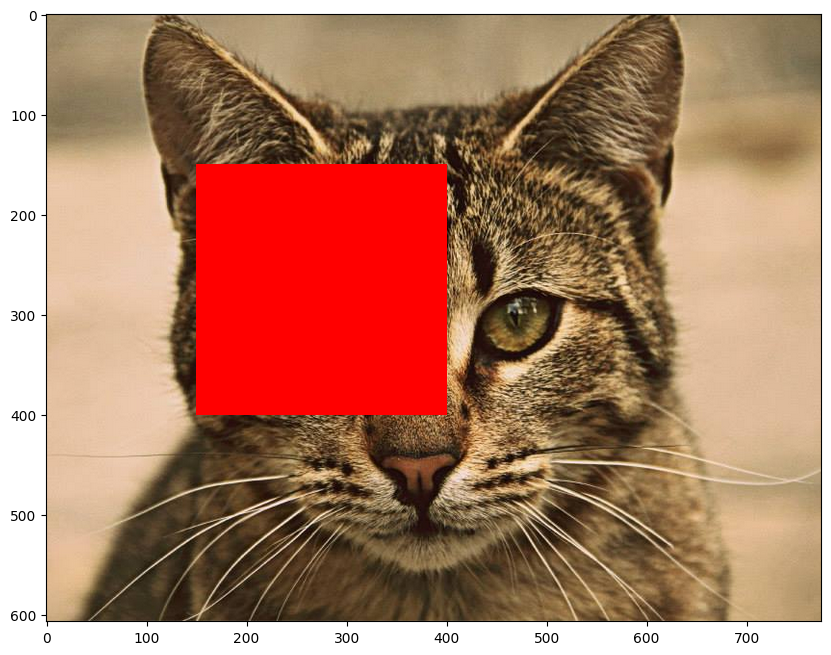

In [41]:
plt.figure(figsize=(10,10)) #tạo figure mới kích thước 10x10 inch
plt.imshow(image_draw) #hiển thị ảnh đã được vẽ hình chữ nhật
plt.show() #hiển thị ảnh ra màn hình

There are other shapes we can use. For example, we can also overlay text on an image: we use the ImageFont module to obtain  bitmap fonts.


In [42]:
from PIL import ImageFont #import module imagefont để làm việc với font chữ khi vẽ text

We use the text method to place the text on the image. The parameters include `xy` (the top-left anchor coordinates of the text), the parameter `text` (the text to be drawn), and `fill` (the color to use for the text).


In [43]:
image_fn.text(xy=(0,0), text="box", fill=(0,0,0)) #vẽ chữ box màu đen tại góc trên trái của ảnh

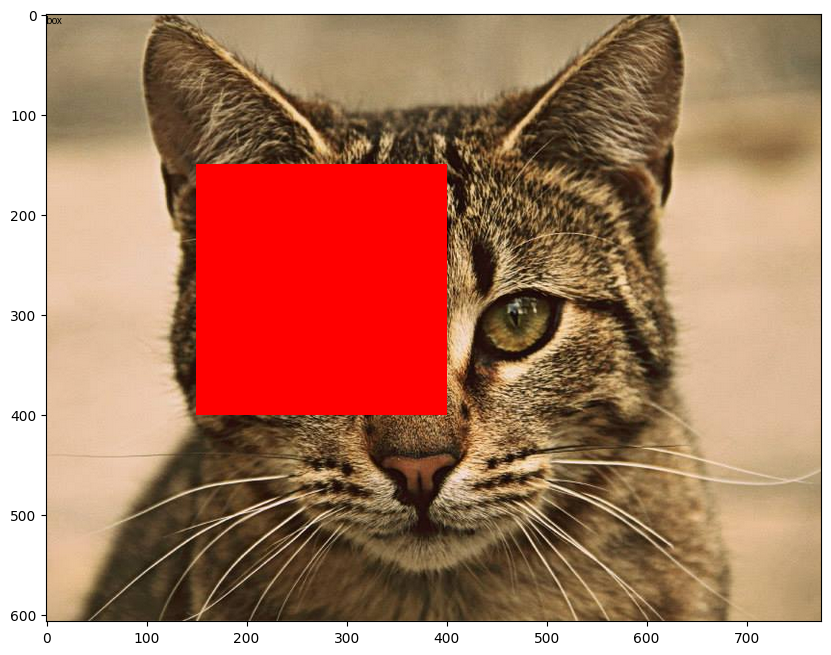

In [44]:
plt.figure(figsize=(10,10)) #tạo figure mới kích thước 10x10 inch
plt.imshow(image_draw) #hiển thị ảnh đã vẽ chữ và hình
plt.show() #hiển thị ảnh ra màn hình

We can overlay or paste one image over another by reassigning the pixel for one array to the next. Consider the following image array:


In [46]:
image_lenna = Image.open("lenna.png") #mở ảnh lenna.png bằng pillow
array_lenna = np.array(image_lenna) #chuyển ảnh lenna sang mảng numpy

We can reassign the pixel values as follows:


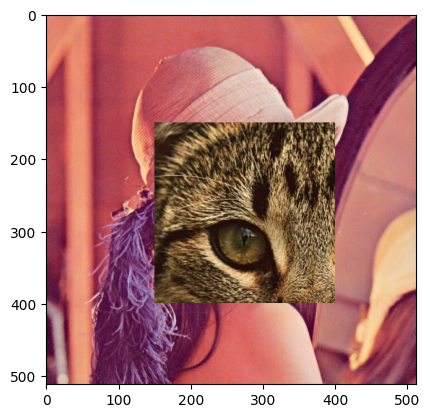

In [47]:
array_lenna[upper:lower, left:right, :] = array[upper:lower, left:right, :] #ghi đè vùng ảnh cat lên ảnh lenna bằng numpy
plt.imshow(array_lenna) #hiển thị ảnh lenna đã bị thay đổi pixel
plt.show() #hiển thị ảnh ra màn hình

In the same manner, the <code>paste()</code> method allows you to overlay one image over another, with the input being the image you would like to overlay. The parameter box is the left and upper coordinate of the image:


In [48]:
image_lenna.paste(crop_image, box=(left,upper)) #dán ảnh đã crop lên ảnh lenna tại vị trí xác định

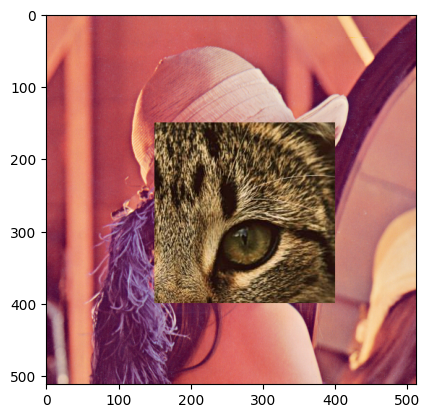

In [49]:
plt.imshow(image_lenna) #hiển thị ảnh lenna sau khi paste
plt.show() #hiển thị ảnh ra màn hình

We can see the method `copy()` applies to some <code>PIL</code> objects. We create two image objects, we set `new_image` to the `image`, and we use the method `copy()` for the `copy_image` object.


In [50]:
image = Image.open("cat.png") #mở lại ảnh cat.png
new_image = image #gán new_image trỏ cùng vùng nhớ với image
copy_image = image.copy() #tạo bản sao độc lập của image

Like the array, we see that the same memory address relationship exists. For example, if we don't use the method `copy()`, the image object has the same memory address as the original PIL image object. 


In [51]:
id(image) == id(new_image) #kiểm tra image và new_image có cùng địa chỉ bộ nhớ hay không

True

If we use the method <code>copy()</code>, the address is different:


In [52]:
id(image) == id(copy_image) #kiểm tra image và copy_image có cùng địa chỉ bộ nhớ hay không

False

If we change the object <code>image</code>, <code>new_image</code> will change, but <code>copy_image</code> will remain the same:


In [53]:
image_fn= ImageDraw.Draw(im=image) #khởi tạo đối tượng vẽ gắn trực tiếp với ảnh image
image_fn.text(xy=(0,0), text="box", fill=(0,0,0)) #vẽ chữ box lên ảnh image
image_fn.rectangle(xy=shape, fill="red") #vẽ hình chữ nhật màu đỏ lên ảnh image

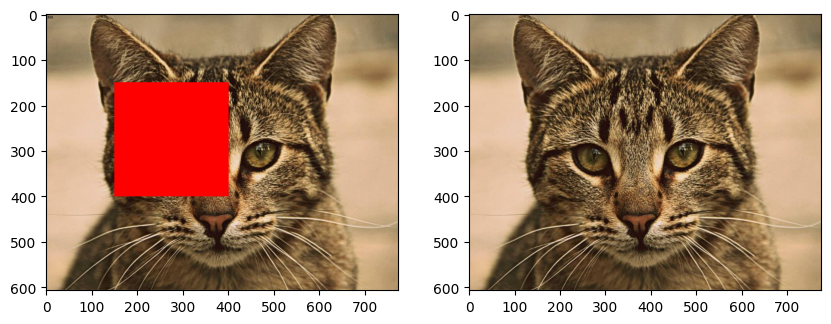

In [54]:
plt.figure(figsize=(10,10)) #tạo figure mới kích thước 10x10 inch
plt.subplot(121) #chia figure thành 1 hàng 2 cột và chọn ô đầu tiên
plt.imshow(new_image) #hiển thị new_image bị thay đổi do dùng chung vùng nhớ
plt.subplot(122) #chuyển sang ô thứ hai
plt.imshow(copy_image) #hiển thị copy_image không bị ảnh hưởng
plt.show() #hiển thị toàn bộ figure

### Question 1:
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a PIL Image object called `im`, flip `im` and create an image called `im_flip`. Mirror `im` and create an image called `im_mirror`. Finally, plot both images.


In [ ]:
# write your script here


Double-click **here** for a hint.

<!-- The hint is below:

im_flip = ImageOps.flip(im)
im_mirror = ImageOps.mirror(im)

-->


Double-click **here** for the solution.

<!-- The answer is below:

im = Image.open("lenna.png")

im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->
